<a href="https://colab.research.google.com/github/Ronisara/Project_Brain_Tumor_Classification/blob/main/Brain_Tumor_Classification_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Brain Tumor Classification (MRI)**

In [21]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


**Creating a data set for the images in the train and validation, and adding augmentation to the images in the train**

In [22]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import datetime
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout, Conv2D
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard

img_width, img_height = 225, 225
BATCH_SIZE = 16
EPOCHS = 80

# files diraction
train_data_dir = '/content/gdrive/MyDrive/final project/train'
validation_data_dir = '/content/gdrive/MyDrive/final project/val'


def preprocess_image(image, label):
    image = tf.image.resize(image, [img_width, img_height])
    image = image / 255.0  # Normalize pixel values
    return image, label

# function to add augmentation
def augment_image(image, label):
    #Lightening/darkening of the images
    image = tf.image.random_brightness(image, max_delta=0.5)
    image = tf.image.resize_with_crop_or_pad(image, img_width, img_height)
    return image, label

# Creating a dataset
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    batch_size=BATCH_SIZE,
    image_size=(img_width, img_height),
    label_mode='int'
).map(preprocess_image).map(augment_image).cache().shuffle(buffer_size=1000).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

val_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    validation_data_dir,
    batch_size=BATCH_SIZE,
    image_size=(img_width, img_height),
    label_mode='int'
).map(preprocess_image).cache().prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

Found 2251 files belonging to 4 classes.
Found 566 files belonging to 4 classes.


**Displaying several images from the train and validation. You can see that the images from the train are darker/brighter, because they were augmented**

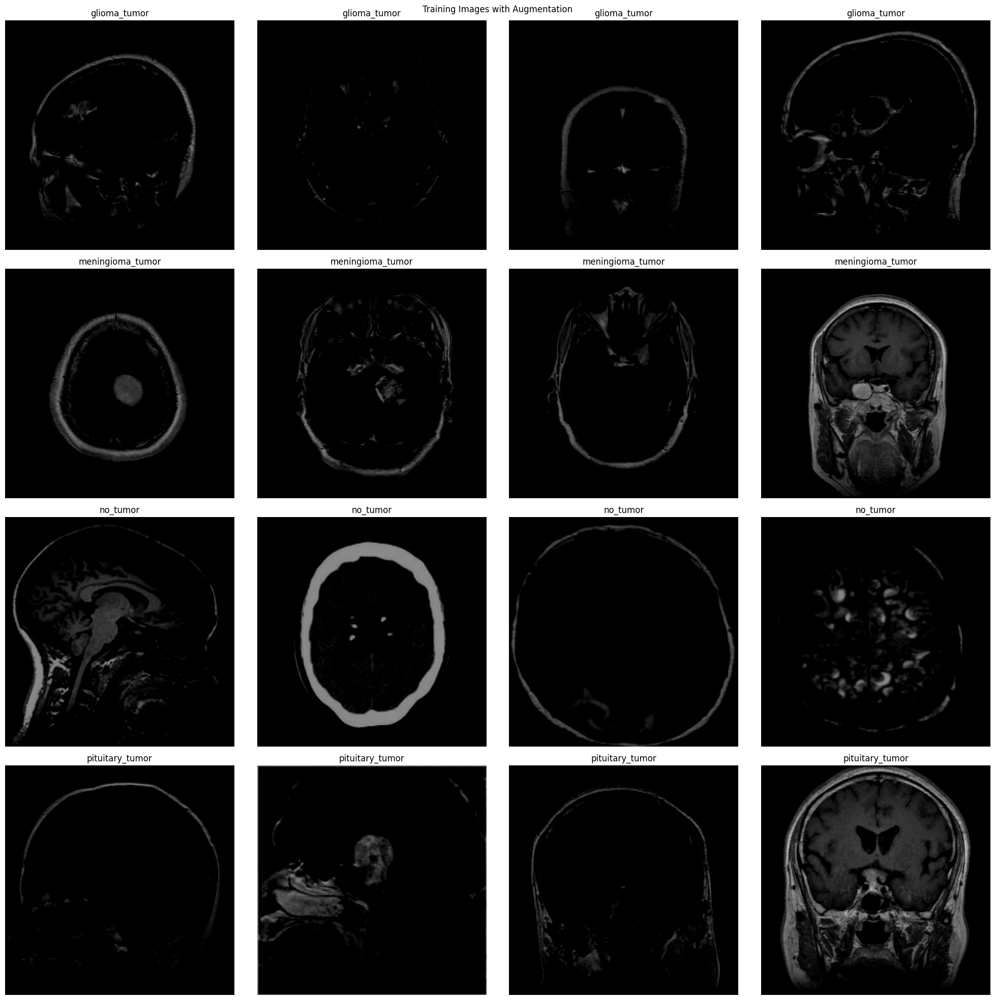

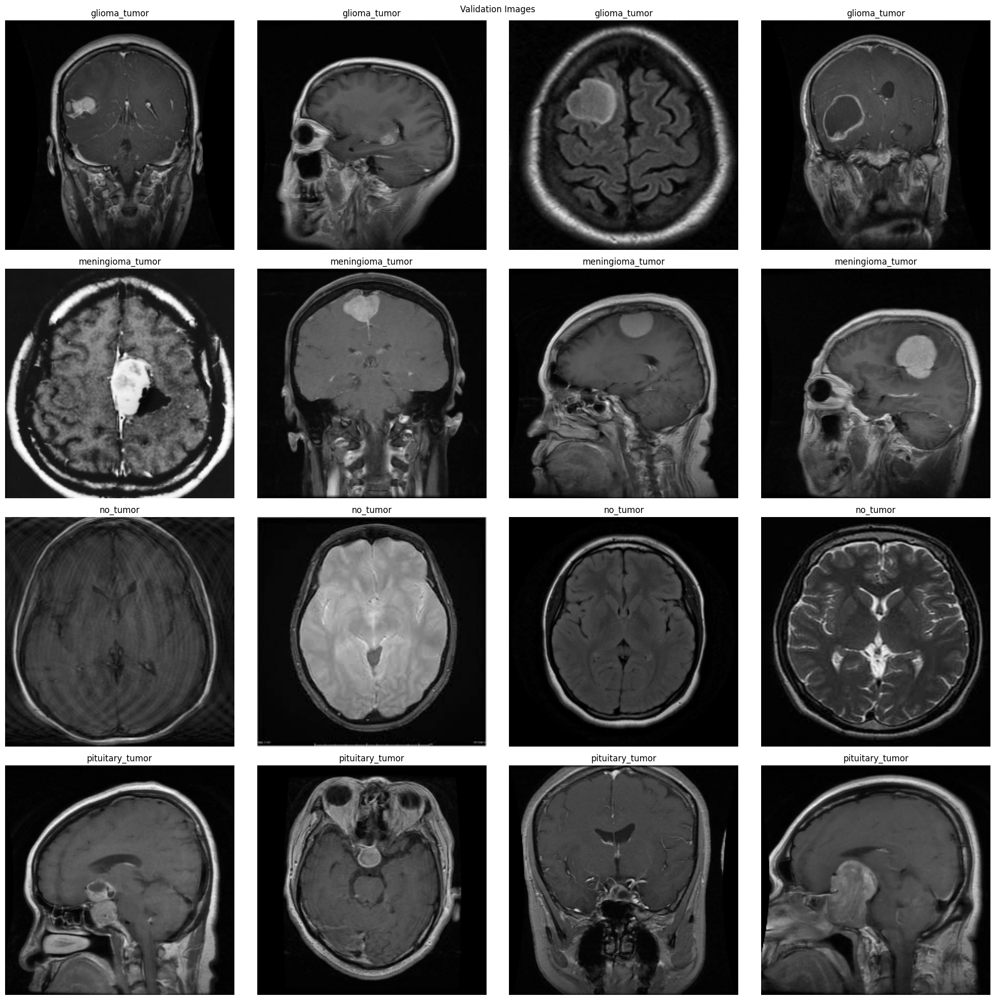

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import os

class_names = sorted([dir_name for dir_name in os.listdir(train_data_dir) if os.path.isdir(os.path.join(train_data_dir, dir_name))])

def get_images_from_each_class(dataset, class_names, num_images=4):
    images = {class_index: [] for class_index in range(len(class_names))}
    labels = {class_index: [] for class_index in range(len(class_names))}

    for image_batch, label_batch in dataset:
        for img, label in zip(image_batch, label_batch):
            class_index = int(label)
            if len(images[class_index]) < num_images:
                images[class_index].append(img.numpy())
                labels[class_index].append(label.numpy())
            if all(len(images[class_index]) >= num_images for class_index in range(len(class_names))):
                break
        if all(len(images[class_index]) >= num_images for class_index in range(len(class_names))):
            break

    all_images = []
    all_labels = []
    for class_index in range(len(class_names)):
        all_images.extend(images[class_index])
        all_labels.extend([class_index] * len(images[class_index]))

    return np.array(all_images), np.array(all_labels)

def plot_images_with_labels(images_arr, labels_arr, class_names, title="Images"):
    fig, axes = plt.subplots(len(class_names), 4, figsize=(20, 20))
    for i, (imgs, lbls) in enumerate(zip(np.array_split(images_arr, len(class_names)), np.array_split(labels_arr, len(class_names)))):
        for img, label, ax in zip(imgs, lbls, axes[i]):
            ax.imshow(img)
            class_index = int(label)
            ax.set_title(class_names[class_index])
            ax.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

sample_train_images, sample_train_labels = get_images_from_each_class(train_dataset, class_names, num_images=4)
plot_images_with_labels(sample_train_images, sample_train_labels, class_names, title="Training Images with Augmentation")

sample_val_images, sample_val_labels = get_images_from_each_class(val_dataset, class_names, num_images=4)
plot_images_with_labels(sample_val_images, sample_val_labels, class_names, title="Validation Images")


**Building the model**

In [24]:
from tensorflow.keras.applications import ResNet50, EfficientNetB0,DenseNet121
from tensorflow.keras.optimizers import SGD
import tensorflow as tf
from tensorflow.keras.layers import Input,GlobalAveragePooling2D, Flatten, Dense, BatchNormalization, Dropout, GlobalMaxPooling2D, Conv2D
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.callbacks import TensorBoard
import datetime
import os



learning_rate=0.0001

base_model = DenseNet121(
            weights='imagenet',  # Load weights pre-trained on ImageNet.
            include_top=False)   # Do not include the ImageNet classifier at the top.
base_model.trainable = False

# top layer
inputs = Input(shape=(img_width,img_height,3))
x1 = base_model(inputs, training=False)
x2=Conv2D(filters=64,kernel_size=(3,3),activation='relu')(x1)
x3 = GlobalAveragePooling2D()(x2)
x4=Dense(1024,activation='relu')(x3)
x5=Dropout(0.3)(x4)
outputs = Dense(4, activation='softmax')(x4)
model = tf.keras.Model(inputs, outputs)

# Number of layers to unfreeze
num_layers_to_unfreeze = 10

# Unfreeze the last `num_layers_to_unfreeze` layers of the base model
for layer in base_model.layers[-num_layers_to_unfreeze:]:
    layer.trainable = True

# Re-compile the model to apply the changes
opt = SGD(learning_rate, momentum=0.9)
model.compile(optimizer=opt, loss=tf.keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])
print(model.summary())


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 225, 225, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ densenet121 (Functional)             │ (None, 7, 7, 1024)          │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 5, 5, 64)            │         589,888 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 64)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1024)                │          66,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 4)                   │           4,100 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,698,052 (29.37 MB)

 Trainable params: 828,676 (3.16 MB)

 Non-trainable params: 6,869,376 (26.20 MB)

None


**Callback setting for early stopping, and for tensorboard**

In [25]:
# tensorboard
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# early stopping
early_stopping_callback = EarlyStopping(
    monitor='val_accuracy',  # Monitor validation accuracy instead of loss
    min_delta=0.0013,          # Smaller delta to be more sensitive to changes
    patience=4,               # Allow a few epochs for slight improvement
    verbose=1,
    restore_best_weights=True # Restore the weights of the best epoch
)



**Training the model**

In [26]:
history = model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=val_dataset,
    callbacks=[tensorboard_callback, early_stopping_callback]
)


Epoch 1/80
141/141 ━━━━━━━━━━━━━━━━━━━━ 64s 304ms/step - accuracy: 0.3570 - loss: 1.3494 - val_accuracy: 0.5459 - val_loss: 1.1257
Epoch 2/80
141/141 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - accuracy: 0.6359 - loss: 1.0231 - val_accuracy: 0.6908 - val_loss: 0.8416
Epoch 3/80
141/141 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - accuracy: 0.7535 - loss: 0.7578 - val_accuracy: 0.7403 - val_loss: 0.6933
Epoch 4/80
141/141 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - accuracy: 0.7851 - loss: 0.6318 - val_accuracy: 0.7580 - val_loss: 0.6307
Epoch 5/80
141/141 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - accuracy: 0.8132 - loss: 0.5669 - val_accuracy: 0.8057 - val_loss: 0.5864
Epoch 6/80
141/141 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - accuracy: 0.8139 - loss: 0.5162 - val_accuracy: 0.8074 - val_loss: 0.5401
Epoch 7/80
141/141 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - accuracy: 0.8367 - loss: 0.4722 - val_accuracy: 0.7951 - val_loss: 0.5272
Epoch 8/80
141/141 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - accuracy: 0.8441 - loss: 0.4238 -

**Presentation of the training data (accuracy and loss and more) by TensorBoard**

In [27]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 6396), started 0:55:07 ago. (Use '!kill 6396' to kill it.)

<IPython.core.display.Javascript object>

**Displaying graphs for Accuracy and Loss**

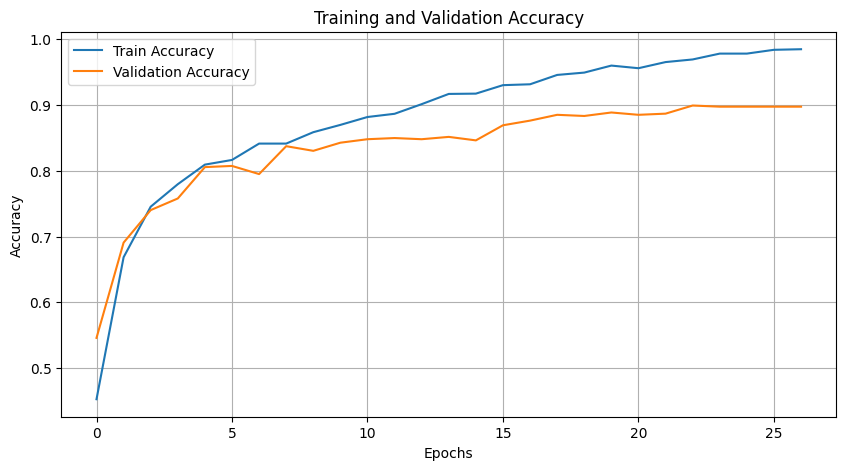

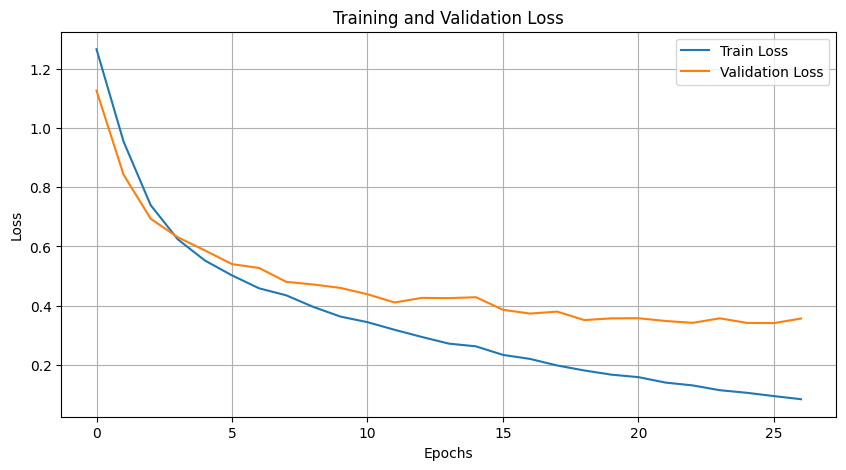

In [28]:
import matplotlib.pyplot as plt

# accuracy
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




**Prediction for all the images in the test, and display of the prediction data- total accuracy, and f1 score, precision, and recall for each category**

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os
from sklearn.metrics import accuracy_score, classification_report

img_width, img_height = 225, 225

# Define the mapping of categories to labels
category_to_label = {
    "pituitary_tumor": 3,
    "glioma_tumor": 0,
    "meningioma_tumor": 1,
    "no_tumor": 2
}

# Initialize lists to store images and labels
images = []
labels = []

# Load all images and labels
for category, label in category_to_label.items():
    path = f"/content/gdrive/MyDrive/final project/test/{category}"
    for image_name in os.listdir(path):
        img_path = os.path.join(path, image_name)
        img = load_img(img_path, color_mode='rgb', target_size=(img_width, img_height))
        img = img_to_array(img)
        img = img.astype('float32') / 255.0
        images.append(img)
        labels.append(label)

# Convert lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Predict categories for all images at once
preds = model.predict(images)
predicted_labels = np.argmax(preds, axis=1)

# Calculate accuracy
accuracy = accuracy_score(labels, predicted_labels)
print("Accuracy:", accuracy)

# Generate classification report
class_names = list(category_to_label.keys())
report = classification_report(labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", report)

# Initialize counters for correct and incorrect predictions per class
correct_counts = {0: 0, 1: 0, 2: 0, 3: 0}
incorrect_counts = {0: 0, 1: 0, 2: 0, 3: 0}

# Update correct and incorrect counts
for true_label, predicted_label in zip(labels, predicted_labels):
    if predicted_label == true_label:
        correct_counts[true_label] += 1
    else:
        incorrect_counts[true_label] += 1

# Print correct and incorrect predictions per class
for category, label in category_to_label.items():
    print(f"Class: {category}")
    print(f"Correct Predictions: {correct_counts[label]}")
    print(f"Incorrect Predictions: {incorrect_counts[label]}")

# Total correct and incorrect predictions
total_correct_predictions = sum(correct_counts.values())
total_incorrect_predictions = sum(incorrect_counts.values())
print("Total Correct Predictions:", total_correct_predictions)
print("Total Incorrect Predictions:", total_incorrect_predictions)

16/16 ━━━━━━━━━━━━━━━━━━━━ 16s 621ms/step
Accuracy: 0.8997995991983968
Classification Report:
                   precision    recall  f1-score   support

 pituitary_tumor       0.90      0.89      0.90       139
    glioma_tumor       0.83      0.88      0.86       141
meningioma_tumor       0.95      0.90      0.92        77
        no_tumor       0.95      0.93      0.94       142

        accuracy                           0.90       499
       macro avg       0.91      0.90      0.90       499
    weighted avg       0.90      0.90      0.90       499

Class: pituitary_tumor
Correct Predictions: 132
Incorrect Predictions: 10
Class: glioma_tumor
Correct Predictions: 124
Incorrect Predictions: 15
Class: meningioma_tumor
Correct Predictions: 124
Incorrect Predictions: 17
Class: no_tumor
Correct Predictions: 69
Incorrect Predictions: 8
Total Correct Predictions: 449
Total Incorrect Predictions: 50


**Prediction for a sample of images, and display of the prediction versus the true category.**

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


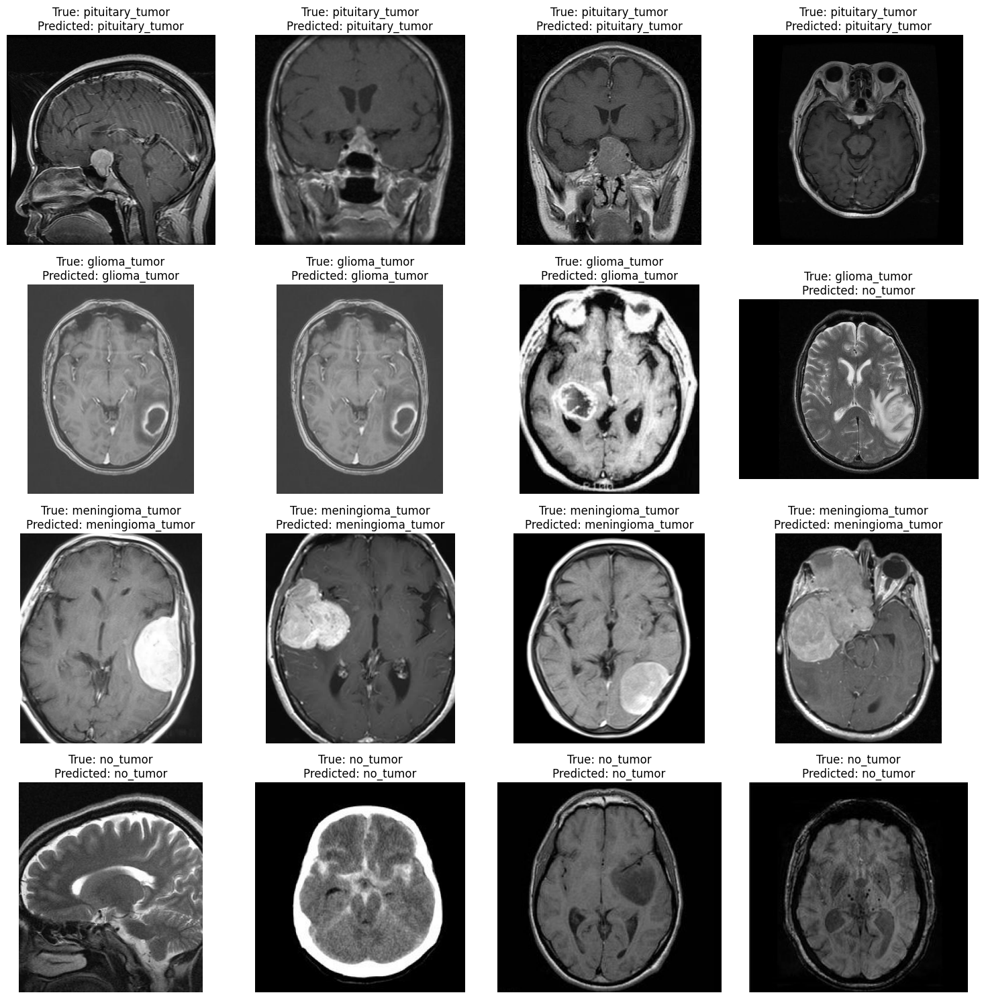

In [30]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os

# Define image dimensions
img_width, img_height = 225, 225

# Define the mapping of categories to labels
category_to_label = {
    "pituitary_tumor": 3,
    "glioma_tumor": 0,
    "meningioma_tumor": 1,
    "no_tumor": 2
}

label_to_category = {v: k for k, v in category_to_label.items()}

# List to hold paths and true labels
image_paths_and_labels = []

# Add 3 images from each category
for category, label in category_to_label.items():
    path = f"/content/gdrive/MyDrive/final project/test/{category}"
    image_names = os.listdir(path)[:4]  # Take the first 3 images
    for image_name in image_names:
        img_path = os.path.join(path, image_name)
        image_paths_and_labels.append((img_path, label))

def predict_single_image(img_path, true_label):
    # Load and preprocess the image
    img = load_img(img_path, color_mode='rgb', target_size=(img_width, img_height))
    img_array = img_to_array(img)
    img_array = img_array.astype('float32') / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Predict the category
    preds = model.predict(img_array)
    predicted_label = np.argmax(preds, axis=1)[0]

    # Return the true category, predicted category, prediction vector, and image
    true_category = label_to_category[true_label]
    predicted_category = label_to_category[predicted_label]
    return true_category, predicted_category, preds, img_path

# Predict for each image in the list and store results
results = [predict_single_image(img_path, true_label) for img_path, true_label in image_paths_and_labels]

# Plot the images in a 4x4 grid
fig, axes = plt.subplots(4, 4, figsize=(15, 15))
axes = axes.flatten()

for ax, (true_category, predicted_category, preds, img_path) in zip(axes, results):
    img = load_img(img_path)
    ax.imshow(img)
    ax.set_title(f"True: {true_category}\nPredicted: {predicted_category}")
    ax.axis('off')

plt.tight_layout()
plt.show()
